<a href="https://colab.research.google.com/github/ajaym416/Home_Automation/blob/master/Cysts_detection_and_quantification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [3]:
# install detectron2: (colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 782kB/s 
     |████████████████████████████████| 2.2MB 2.8MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200716-cp36-none-any.whl size=42325 sha256=a7ad5a27152aa377e8a93e9303dc0647ed0faa0871e29eff255ad46edc48cd74
  Stored in directory: /root/.cache/pip/wheels/81/99/f4/42a6bef61c07b3d78dfe6d7ebff259444c4526504cf72378d7
Successfully built fvcore
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
import torch, torchvision

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode
import skimage.draw
import math


In [2]:
torch.cuda.is_available()

True

In [3]:
from google.colab import drive
drive.mount('/content/drive')
# drive.flush_and_unmount

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [4]:
def get_cysts_dicts(img_dir):
    # load the JSON file
    json_file = os.path.join(img_dir, "via_final.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    # loop through the entries in the JSON file
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        # add file_name, image_id, height and width information to the records
        filename = os.path.join(img_dir, v["filename"])
        # print(idx,filename)
        height, width = cv2.imread(filename).shape[:2]
        # print(height ,width)
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        annos = v["regions"]

        objs = []
        # one image can have multiple annotations, therefore this loop is needed
        for annotation in annos:
            # reformat the polygon information to fit the specifications
            anno = annotation["shape_attributes"]
            #Since we  only have the ellipse
            # if anno["name"]== "ellipse"
            # "cx":171,"cy":227,"rx":7.6,"ry":8.158,"theta":0.197
            cx = anno["cx"]
            cy = anno["cy"]
            rx= anno["rx"]
            ry=anno["ry"]
            theta =anno["theta"]
            # px, py = skimage.draw.ellipse(cy, cx, ry, rx,rotation=theta)
            # # px, py = skimage.draw.ellipse_perimeter(cy,cx,round(ry),round(rx),orientation=theta)
            # poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            # poly = [p for x in poly for p in x]

            region_attributes = annotation["region_attributes"]["Cyst-type"]

            # specify the category_id to match with the class.

            if "Giardia" in region_attributes:
                category_id = 1
            elif "Crypto" in region_attributes:
                category_id = 0
            def ellipse_to_rectange(rx,ry,theta):
              angle = theta*math.pi/180
              ea = rx*math.cos(theta)
              eb = ry*math.sin(theta)
              ec = rx*math.sin(theta)
              ed = ry*math.cos(theta)
              width = math.sqrt(math.pow(ea,2)+math.pow(eb,2))*2
              height = math.sqrt(math.pow(ec,2)+math.pow(ed,2))*2
              return (width ,height)
            width , height = ellipse_to_rectange(rx,ry,theta)

            obj = {
                # "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                # "bbox": [cx-rx+0.5, cy-ry+0.5, cx+rx+0.5 , cy+ry+0.5],
                "bbox": [cx-width*0.5,cy-height*0.5,cx+width*0.5,cy+height*0.5],
                "bbox_mode": BoxMode.XYXY_ABS,
                # "segmentation": [poly],
                "segmentation": [],
                "category_id": category_id,
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)

    return dataset_dicts
  
for d in ["train", "val","test"]:
    DatasetCatalog.register("cysts_" + d, lambda d=d: get_cysts_dicts("/content/drive/My Drive/Datasets/split_cysts2/" + d))
    MetadataCatalog.get("cysts_" + d).set(thing_classes=["crypto" ,"Giardia"])
cysts_metadata = MetadataCatalog.get("cysts_train")

/content/drive/My Drive/Datasets/split_cysts2/test/237.jpg


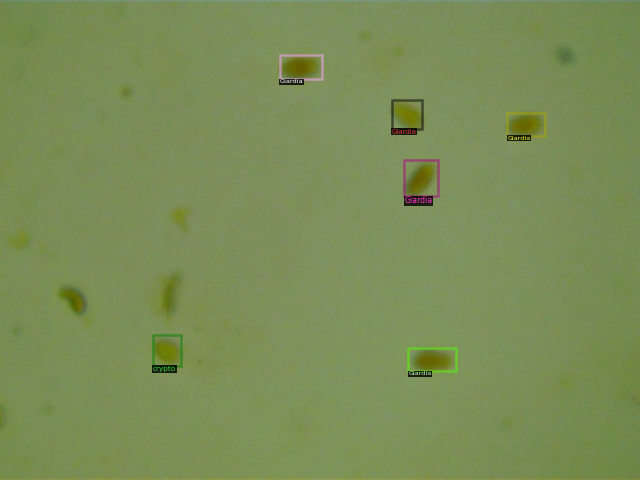

/content/drive/My Drive/Datasets/split_cysts2/test/236.jpg


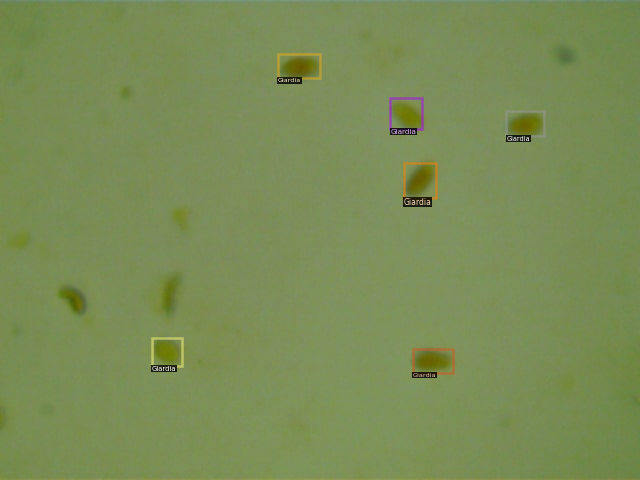

/content/drive/My Drive/Datasets/split_cysts2/test/230.jpg


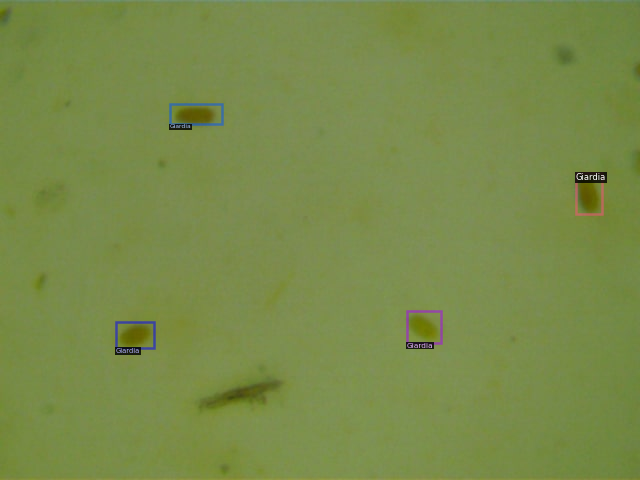

/content/drive/My Drive/Datasets/split_cysts2/test/232.jpg


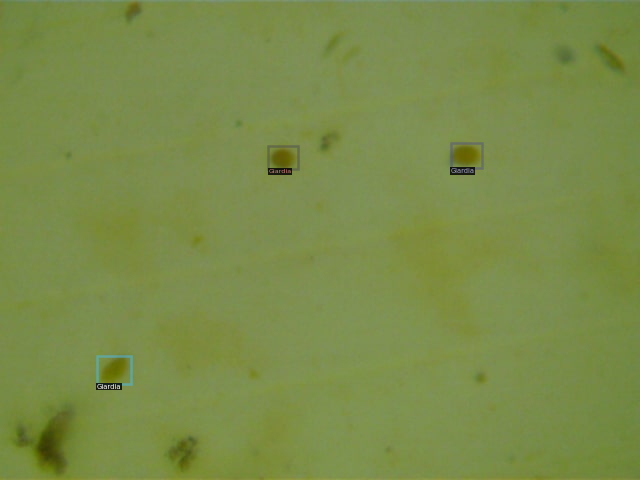

/content/drive/My Drive/Datasets/split_cysts2/test/47.jpg


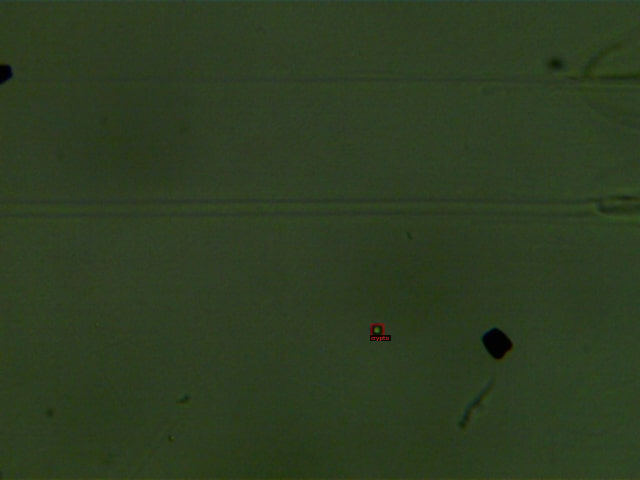

/content/drive/My Drive/Datasets/split_cysts2/test/228.jpg


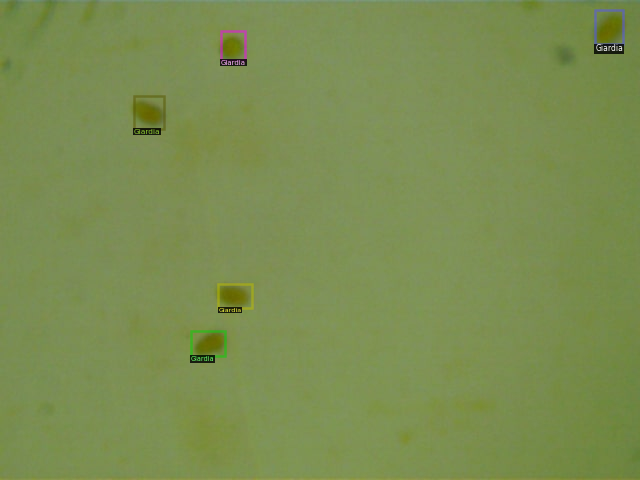

/content/drive/My Drive/Datasets/split_cysts2/test/233.jpg


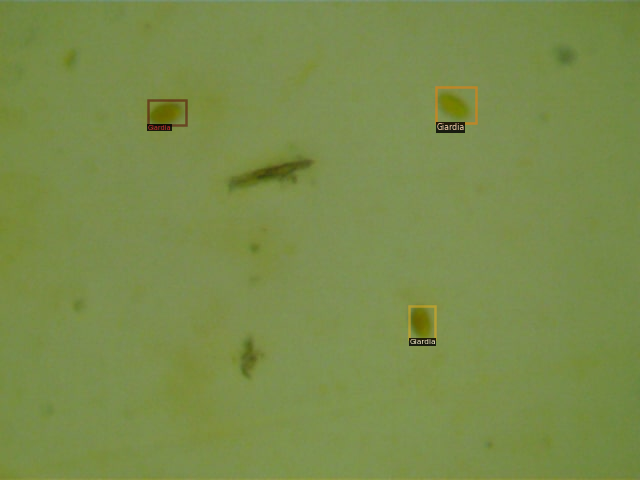

/content/drive/My Drive/Datasets/split_cysts2/test/240.jpg


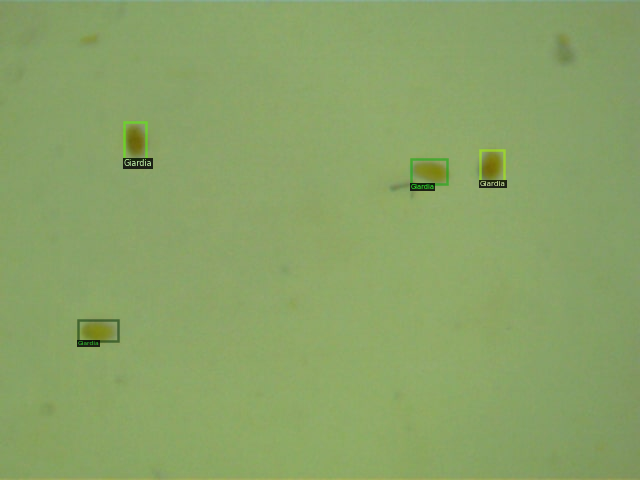

/content/drive/My Drive/Datasets/split_cysts2/test/238.jpg


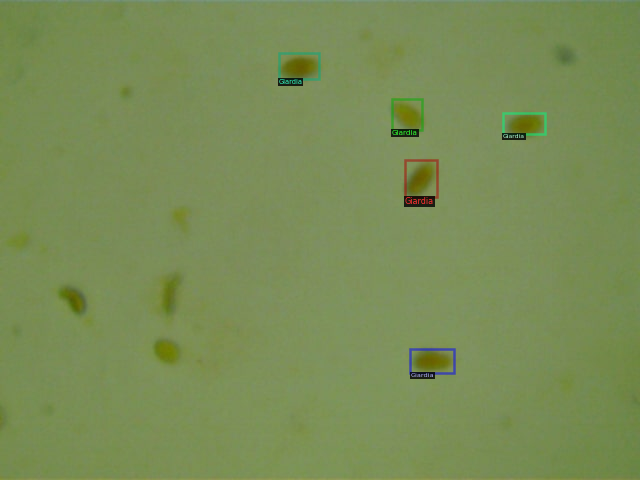

/content/drive/My Drive/Datasets/split_cysts2/test/61.jpg


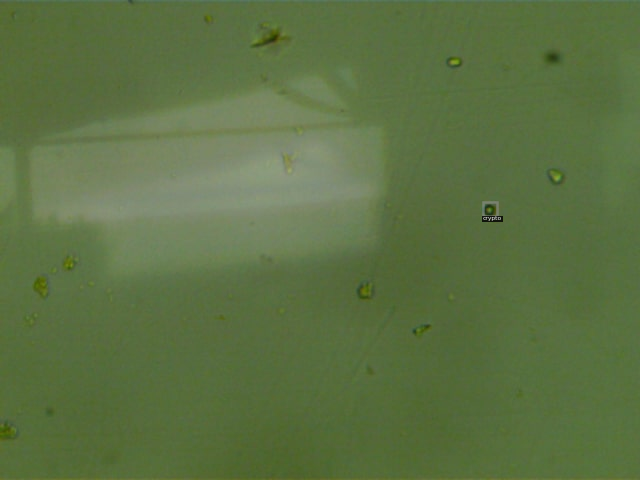

In [5]:
dataset_dicts = get_cysts_dicts("/content/drive/My Drive/Datasets/split_cysts2/test/")
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    print(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=cysts_metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [6]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("/content/drive/My Drive/cysts_output/coco_eval", exist_ok=True)
        output_folder = "/content/drive/My Drive/cysts_output/coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [23]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
# cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = ("cysts_train",)
cfg.DATASETS.TEST = ("cysts_val",)

cfg.DATALOADER.NUM_WORKERS = 4
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo

cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 400
cfg.SOLVER.MAX_ITER = 800 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (400, 800)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 200
cfg.OUTPUT_DIR = "/content/drive/My Drive/cysts_output"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/11 04:50:05 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.


[08/11 04:50:07 d2.engine.train_loop]: Starting training from iteration 0
[08/11 04:50:38 d2.utils.events]:  eta: 0:21:29  iter: 19  total_loss: 2.104  loss_cls: 1.303  loss_box_reg: 0.685  loss_rpn_cls: 0.102  loss_rpn_loc: 0.010  time: 1.5404  data_time: 0.0304  lr: 0.000048  max_mem: 9790M
[08/11 04:51:09 d2.utils.events]:  eta: 0:20:54  iter: 39  total_loss: 1.561  loss_cls: 0.695  loss_box_reg: 0.831  loss_rpn_cls: 0.013  loss_rpn_loc: 0.010  time: 1.5462  data_time: 0.0141  lr: 0.000098  max_mem: 9790M
[08/11 04:51:40 d2.utils.events]:  eta: 0:19:31  iter: 59  total_loss: 1.319  loss_cls: 0.473  loss_box_reg: 0.831  loss_rpn_cls: 0.008  loss_rpn_loc: 0.008  time: 1.5398  data_time: 0.0142  lr: 0.000148  max_mem: 9790M
[08/11 04:52:11 d2.utils.events]:  eta: 0:18:59  iter: 79  total_loss: 1.163  loss_cls: 0.349  loss_box_reg: 0.815  loss_rpn_cls: 0.004  loss_rpn_loc: 0.010  time: 1.5449  data_time: 0.0150  lr: 0.000198  max_mem: 9790M
[08/11 04:52:42 d2.utils.events]:  eta: 0:17:3

In [24]:
# Look at training curves in tensorboard:
%load_ext tensorboard
# %tensorboard --logdir output
%tensorboard --logdir "/content/drive/My Drive/cysts_output"

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 642), started 0:26:08 ago. (Use '!kill 642' to kill it.)

<IPython.core.display.Javascript object>

In [38]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "/content/drive/My Drive/checkpoint.pth")
# cfg.MODEL.WEIGHTS ="/content/drive/My Drive/models/checkpoint.pth"

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.94
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("cysts_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "cysts_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[08/11 05:41:27 d2.data.common]: Serializing 17 elements to byte tensors and concatenating them all ...
[08/11 05:41:27 d2.data.common]: Serialized dataset takes 0.01 MiB
[08/11 05:41:27 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/11 05:41:27 d2.evaluation.evaluator]: Start inference on 17 images
[08/11 05:41:29 d2.evaluation.evaluator]: Inference done 11/17. 0.1774 s / img. ETA=0:00:01
[08/11 05:41:30 d2.evaluation.evaluator]: Total inference time: 0:00:02.253880 (0.187823 s / img per device, on 1 devices)
[08/11 05:41:30 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.177078 s / img per device, on 1 devices)
[08/11 05:41:30 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[08/11 05:41:30 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[08/11 05:41:30 d2.evaluation.coco_evaluation]: Evaluating pred

OrderedDict([('bbox',
              {'AP': 58.30665129519467,
               'AP-Giardia': 68.65337802650437,
               'AP-crypto': 47.95992456388497,
               'AP50': 91.91654879773692,
               'AP75': 63.597359735973605,
               'APl': nan,
               'APm': nan,
               'APs': 58.64645580139521})])

In [66]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("cysts_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.96   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("cysts_test")

/content/drive/My Drive/Datasets/split_cysts2/test/33.jpg


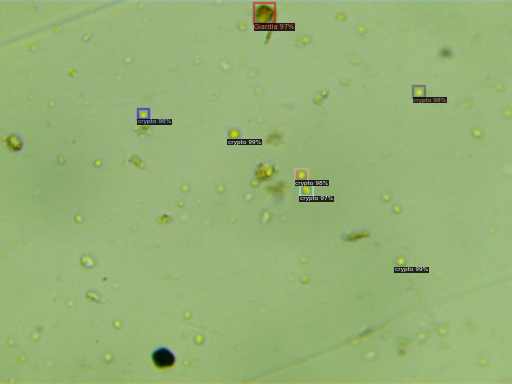

giardia=1 , crypto = 6
33.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/47.jpg


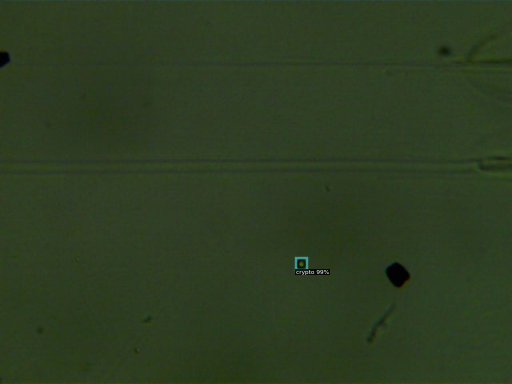

giardia=0 , crypto = 1
47.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/61.jpg


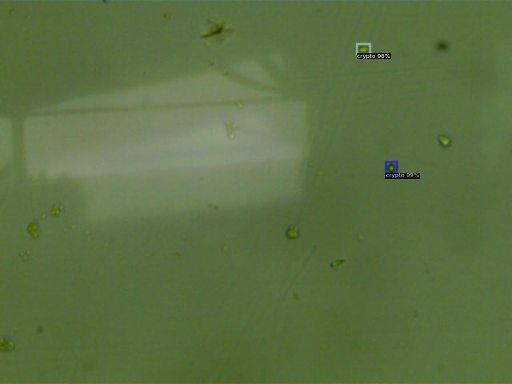

giardia=0 , crypto = 2
61.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/77.jpg


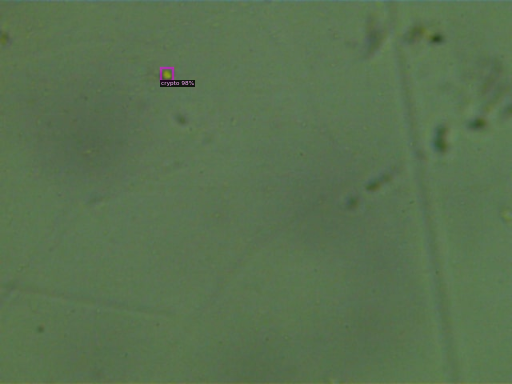

giardia=0 , crypto = 1
77.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/227.jpg


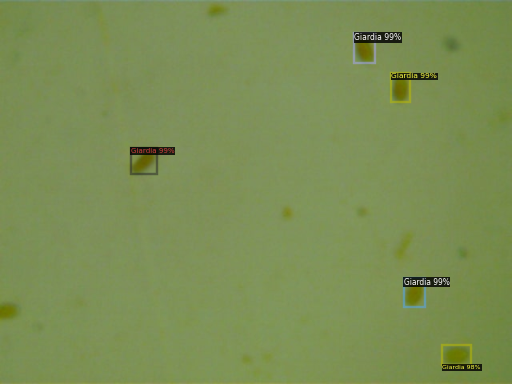

giardia=5 , crypto = 0
227.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/228.jpg


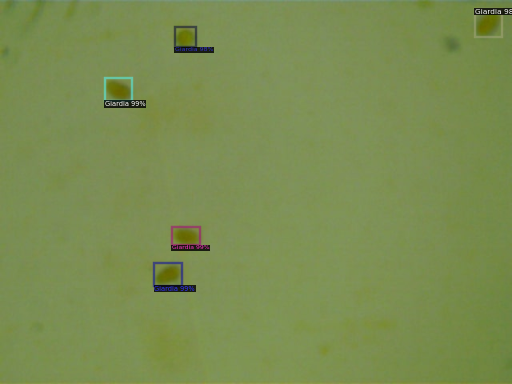

giardia=5 , crypto = 0
228.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/229.jpg


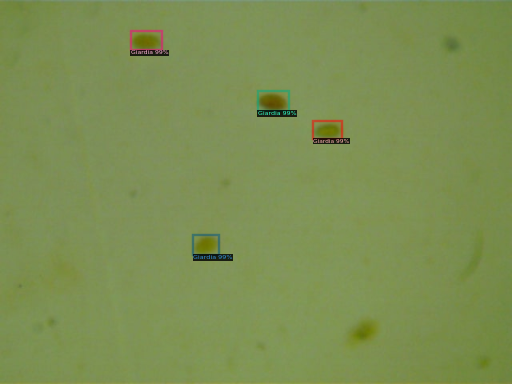

giardia=4 , crypto = 0
229.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/240.jpg


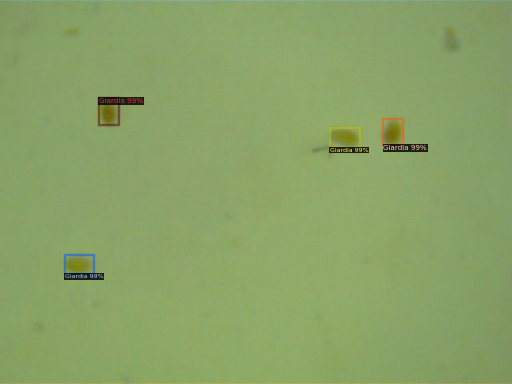

giardia=4 , crypto = 0
240.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/230.jpg


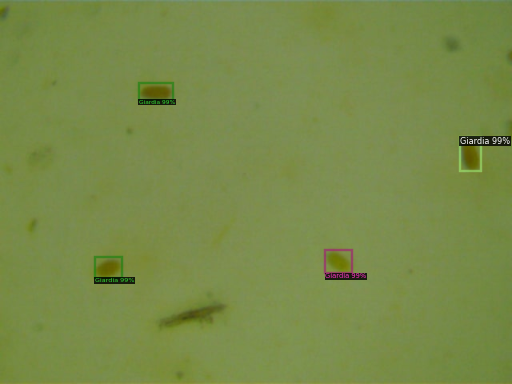

giardia=4 , crypto = 0
230.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/235.jpg


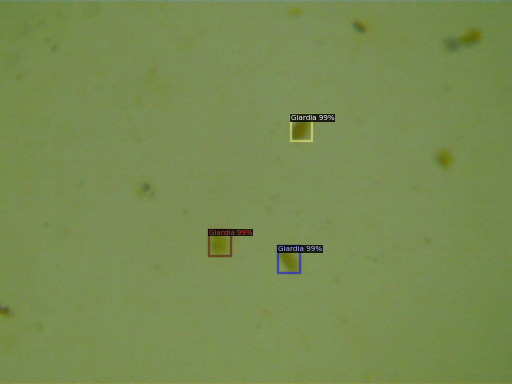

giardia=3 , crypto = 0
235.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/234.jpg


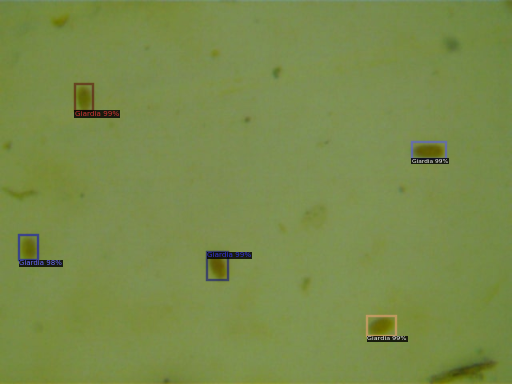

giardia=5 , crypto = 0
234.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/239.jpg


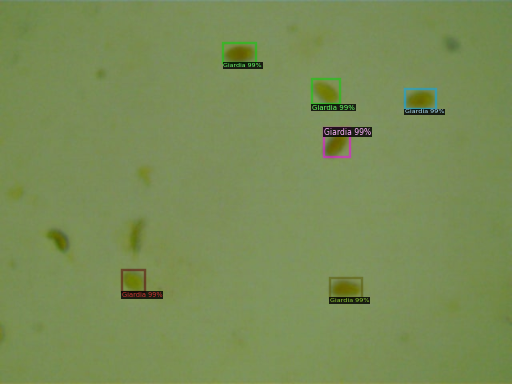

giardia=6 , crypto = 0
239.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/238.jpg


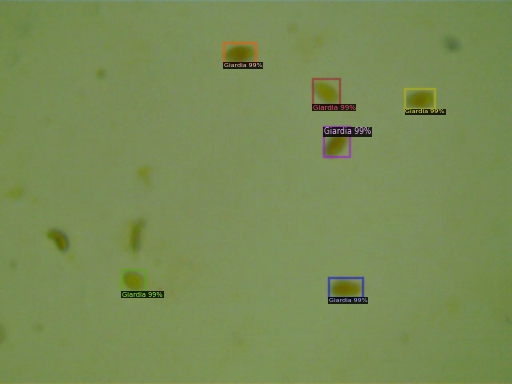

giardia=6 , crypto = 0
238.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/236.jpg


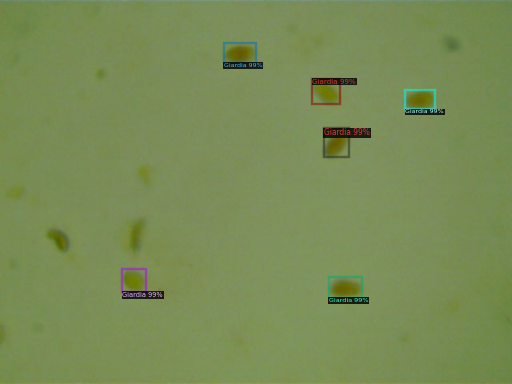

giardia=6 , crypto = 0
236.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/233.jpg


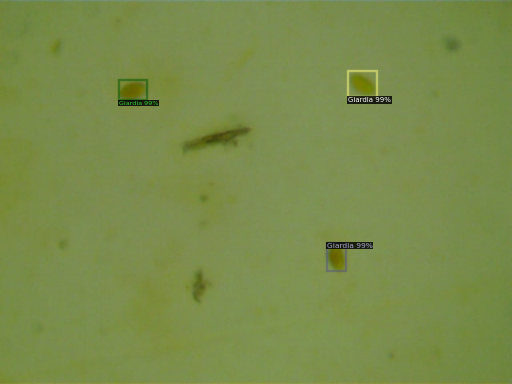

giardia=3 , crypto = 0
233.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/237.jpg


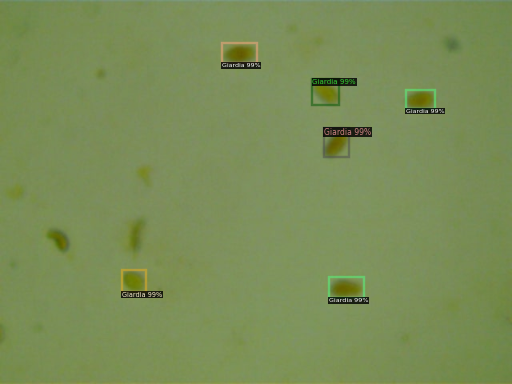

giardia=6 , crypto = 0
237.jpg
/content/drive/My Drive/Datasets/split_cysts2/test/232.jpg


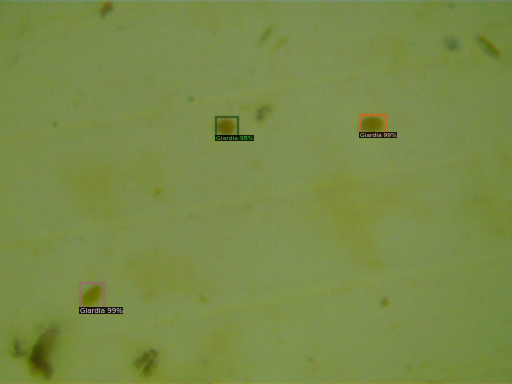

giardia=3 , crypto = 0
232.jpg


In [67]:
from detectron2.utils.visualizer import ColorMode
import glob
import pandas as pd
df2 = pd.DataFrame(columns=["Filename2", "Pred_Giardia" ,"Pred_Crypto" ])
for index,imageName in enumerate(glob.glob('/content/drive/My Drive/Datasets/split_cysts2/test/*jpg')):
  print(imageName)
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  out_class = outputs["instances"].pred_classes.tolist()
  pred_giardia , pred_crypto = 0,0
  for classes in out_class:
    if classes == 0:
      pred_crypto+=1
    elif classes ==1:
      pred_giardia+=1
  print(f"giardia={pred_giardia} , crypto = {pred_crypto}")
  filename = os.path.split(imageName)[-1]
  df2.loc[index,"Filename2"]=filename
  df2.loc[index,"Pred_Giardia"]=pred_giardia
  df2.loc[index,"Pred_Crypto"]=pred_crypto
  print(filename)


In [68]:
df2=df2.sort_values(by=['Filename2'],ignore_index=True)
df2

,Filename2,Pred_Giardia,Pred_Crypto
0,227.jpg,5,0
1,228.jpg,5,0
2,229.jpg,4,0
3,230.jpg,4,0
4,232.jpg,3,0
5,233.jpg,3,0
6,234.jpg,5,0
7,235.jpg,3,0
8,236.jpg,6,0
9,237.jpg,6,0


In [69]:
json_file = "/content/drive/My Drive/Datasets/split_cysts2/test/via_final.json"
with open(json_file) as f:
    imgs_anns = json.load(f)
df = pd.DataFrame(columns=["Filename", "Actual_Giardia" ,"Actual_Crypto" ])
for index, v in enumerate(imgs_anns.values()):
    giardia , crypto = 0,0
    regions = v["regions"]
#     print(v["filename"])
    for region_attribs in regions:
        if region_attribs["region_attributes"]["Cyst-type"] == "Giardia":
            giardia +=1
        elif region_attribs["region_attributes"]["Cyst-type"]=="Crypto":
            crypto+=1
    filename =v["filename"]
    df.loc[index,"Filename"]=filename
    df.loc[index,"Actual_Giardia"]=giardia
    df.loc[index,"Actual_Crypto"]=crypto
    print(f"{filename} contains {giardia} giardia and {crypto} crypto")

227.jpg contains 5 giardia and 0 crypto
228.jpg contains 5 giardia and 0 crypto
229.jpg contains 4 giardia and 0 crypto
230.jpg contains 4 giardia and 0 crypto
232.jpg contains 3 giardia and 0 crypto
233.jpg contains 3 giardia and 0 crypto
234.jpg contains 5 giardia and 0 crypto
235.jpg contains 3 giardia and 0 crypto
236.jpg contains 6 giardia and 0 crypto
237.jpg contains 5 giardia and 1 crypto
238.jpg contains 5 giardia and 0 crypto
239.jpg contains 5 giardia and 0 crypto
240.jpg contains 4 giardia and 0 crypto
33.jpg contains 0 giardia and 8 crypto
47.jpg contains 0 giardia and 1 crypto
61.jpg contains 0 giardia and 1 crypto
77.jpg contains 0 giardia and 1 crypto


In [70]:
df.sort_values(by=['Filename'] ,inplace=True,ignore_index=True)


In [71]:
df

,Filename,Actual_Giardia,Actual_Crypto
0,227.jpg,5,0
1,228.jpg,5,0
2,229.jpg,4,0
3,230.jpg,4,0
4,232.jpg,3,0
5,233.jpg,3,0
6,234.jpg,5,0
7,235.jpg,3,0
8,236.jpg,6,0
9,237.jpg,5,1


In [72]:
final_df = pd.concat([df,df2],axis=1 )

In [73]:
final_df.drop(columns='Filename2',inplace=True)
final_df = final_df[['Filename', 'Actual_Giardia', 'Pred_Giardia', 'Actual_Crypto', 'Pred_Crypto']]

In [74]:
def highlight_correct(x):
    return ['background-color: green' if (x['Actual_Giardia']==x["Pred_Giardia"] and x['Actual_Crypto']==x['Pred_Crypto'] )else 'background-color: red' for v in x]
final_df.style.apply(highlight_correct,axis =1)


,Filename,Actual_Giardia,Pred_Giardia,Actual_Crypto,Pred_Crypto
0,227.jpg,5,5,0,0
1,228.jpg,5,5,0,0
2,229.jpg,4,4,0,0
3,230.jpg,4,4,0,0
4,232.jpg,3,3,0,0
5,233.jpg,3,3,0,0
6,234.jpg,5,5,0,0
7,235.jpg,3,3,0,0
8,236.jpg,6,6,0,0
9,237.jpg,5,6,1,0


In [75]:
import matplotlib.pyplot as plt
# import seaborn as sns

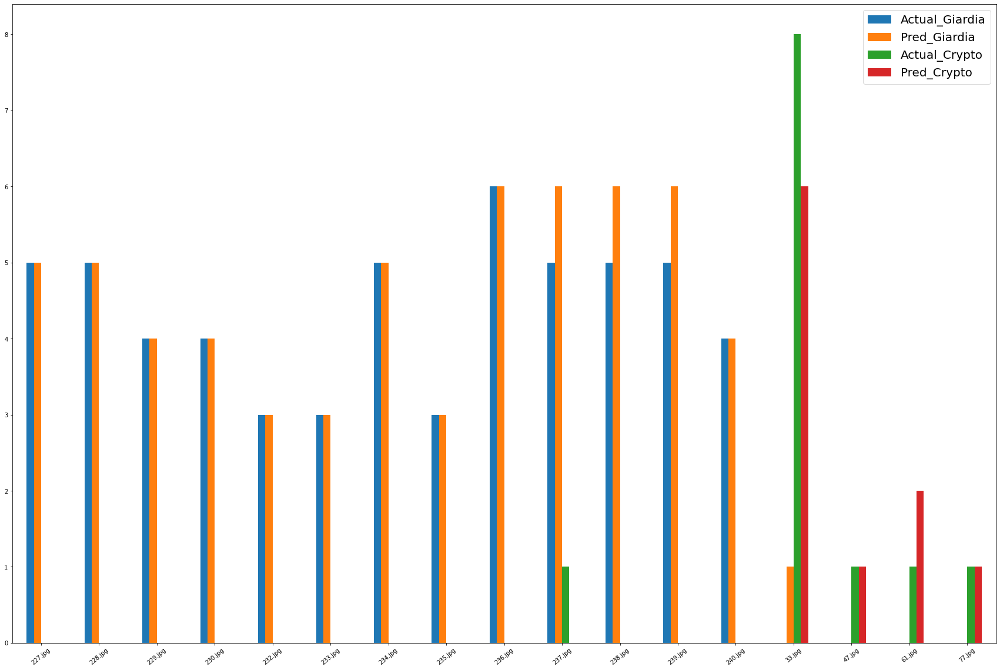

In [76]:
x=final_df.plot.bar(figsize = (30,20))
x.set_xticklabels(final_df['Filename'], rotation = 40,fontsize =10)
x.legend(fontsize = 20)


In [77]:
final_df.to_excel("output.xlsx")  
